<a href="https://colab.research.google.com/github/femina-dev/Project_INSE6220/blob/main/Riceseed_classification_algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Principal Component Analysis and classification of Rice seed**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Install Pycaret**

In [2]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

**Import Libraries**

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [5]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

The data used in this analysis is Rice Seed Data. Rice, which is among the most widely produced grain products worldwide, has many genetic varieties. These varieties are separated from each other due to some of their features. It has 10 attributes that correspond to the classification of rice seed with these features that distinguish rice varieties, it is possible to classify and evaluate the quality of seeds.In this study Ipsala,Karacadag,Arborio are three different varieties of rice were used. 506 elements each, randomly selected for the experiment with label include area, perimeter, aspect ratio etc. Models were created by using Artificial Neural Network (ANN) and Deep Neural Network (DNN) algorithms for the feature dataset and classification processes were performed.

The data set can be used for the tasks of classification of rive varieties and cluster analysis and evaluate the quality of seeds.

Attribute Information:

To construct the data, Ten geometric parameters and attributes of Rice seed were measured:
1. Area AR,
2. perimeter PR,
3. Majoraxislength MAL,
4. Minoraxislength MIL,
5. Eccentricity EC,
6. EquivDiameter ED,
7. ConvexArea CA,
8. Extend EX,
9. Aspectratio AS,
10. Roundness RO.
All of these parameters were real-valued continuous.

https://www.muratkoklu.com/datasets/

https://www.muratkoklu.com/datasets/vtdhnd08.php

https://github.com/femina-dev/Project_INSE6220/blob/main/seed.csv

In [6]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/femina-dev/Project_INSE6220/main/seed.csv')
df.head(25)

,AR,PR,MAL,MIL,EC,ED,CA,EX,AS,RO,class
0,11648,445.527,178.4659,84.9327,0.8795,121.7813,12135,0.5660,2.1013,0.7374,1
1,12769,447.830,184.4764,88.6296,0.8770,127.5068,13024,0.6733,2.0814,0.8001,1
2,14835,488.965,196.5303,97.3891,0.8686,137.4355,15263,0.6910,2.0180,0.7797,1
3,9475,408.427,178.9363,67.5776,0.9259,109.8360,9652,0.5299,2.6479,0.7138,1
4,12849,456.372,188.4676,88.1827,0.8838,127.9056,13187,0.7814,2.1372,0.7752,1
5,14883,485.363,203.2395,94.3304,0.8858,137.6576,15093,0.6267,2.1545,0.7939,1
6,13545,470.587,198.7273,88.0138,0.8966,131.3241,13788,0.5821,2.2579,0.7686,1
7,13084,460.910,190.8731,88.5734,0.8858,129.0700,13347,0.5865,2.1550,0.7740,1
8,12501,451.281,185.8183,87.0528,0.8835,126.1617,12844,0.6212,2.1345,0.7714,1
9,15917,515.441,212.7014,97.5204,0.8887,142.3592,16400,0.6048,2.1811,0.7529,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AR      506 non-null    int64  
 1   PR      506 non-null    float64
 2   MAL     506 non-null    float64
 3   MIL     506 non-null    float64
 4   EC      506 non-null    float64
 5   ED      506 non-null    float64
 6   CA      506 non-null    int64  
 7   EX      506 non-null    float64
 8   AS      506 non-null    float64
 9   RO      506 non-null    float64
 10  class   506 non-null    int64  
dtypes: float64(8), int64(3)
memory usage: 43.6 KB


In [8]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [9]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

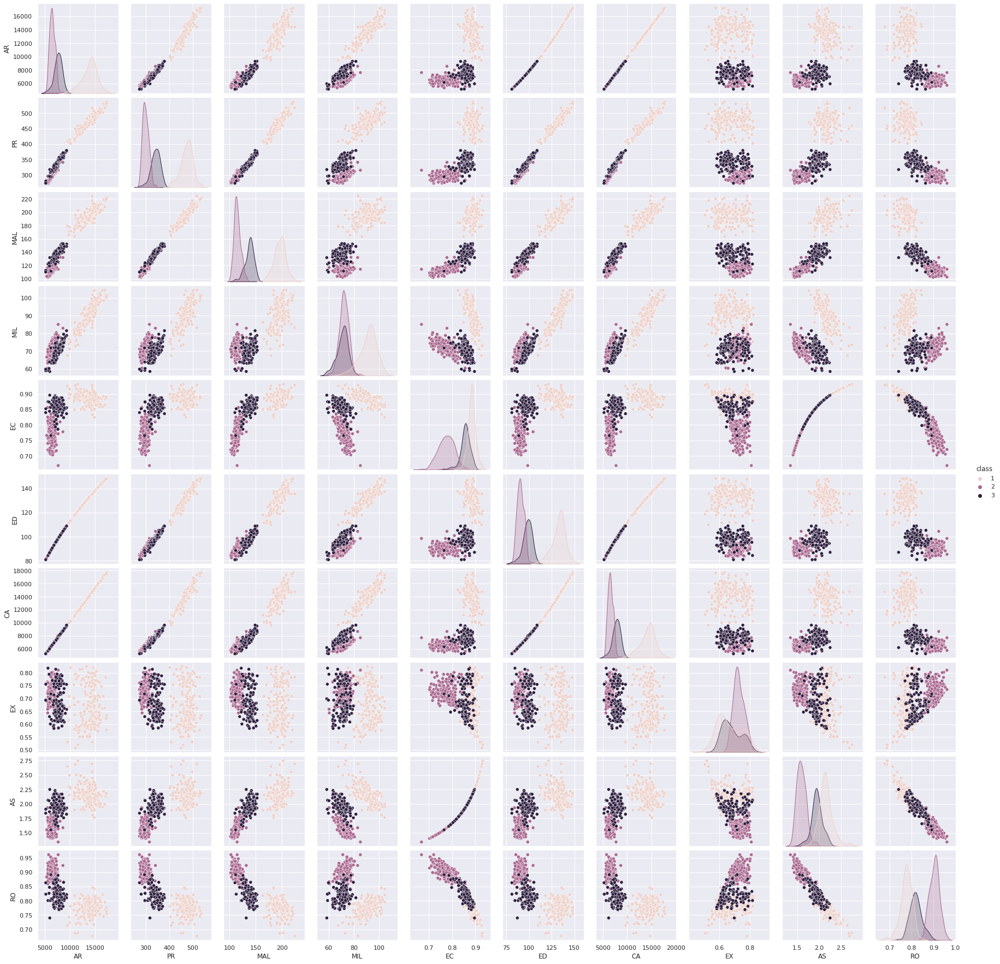

In [10]:
sns.pairplot(df, hue='class')
plt.show()

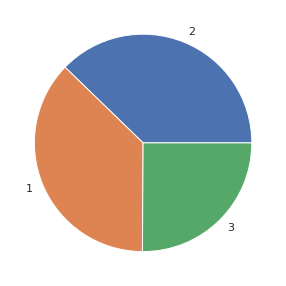

In [11]:
y =df['class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [12]:
X = df.drop(columns=['class'])
X.head(10)

,AR,PR,MAL,MIL,EC,ED,CA,EX,AS,RO
0,11648,445.527,178.4659,84.9327,0.8795,121.7813,12135,0.5660,2.1013,0.7374
1,12769,447.830,184.4764,88.6296,0.8770,127.5068,13024,0.6733,2.0814,0.8001
2,14835,488.965,196.5303,97.3891,0.8686,137.4355,15263,0.6910,2.0180,0.7797
3,9475,408.427,178.9363,67.5776,0.9259,109.8360,9652,0.5299,2.6479,0.7138
4,12849,456.372,188.4676,88.1827,0.8838,127.9056,13187,0.7814,2.1372,0.7752
5,14883,485.363,203.2395,94.3304,0.8858,137.6576,15093,0.6267,2.1545,0.7939
6,13545,470.587,198.7273,88.0138,0.8966,131.3241,13788,0.5821,2.2579,0.7686
7,13084,460.910,190.8731,88.5734,0.8858,129.0700,13347,0.5865,2.1550,0.7740
8,12501,451.281,185.8183,87.0528,0.8835,126.1617,12844,0.6212,2.1345,0.7714
9,15917,515.441,212.7014,97.5204,0.8887,142.3592,16400,0.6048,2.1811,0.7529


In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
AR,506.0,9487.895257,3554.704699,5146.0000,6529.750000,7667.00000,13452.500000,17285.0000
PR,506.0,374.466891,80.376250,273.6300,302.951500,341.99250,463.930750,536.4050
MAL,506.0,150.675767,36.918690,102.2313,116.284275,138.80810,190.913525,224.4403
MIL,506.0,78.901814,10.816671,58.5632,71.057325,74.63920,89.426050,104.4405
EC,506.0,0.835774,0.054863,0.6688,0.790050,0.85555,0.880450,0.9315
ED,506.0,108.088237,19.952034,80.9450,91.180825,98.80245,130.874925,148.3508
CA,506.0,9696.389328,3643.710367,5254.0000,6664.000000,7867.00000,13760.250000,17732.0000
EX,506.0,0.694532,0.065862,0.5078,0.640975,0.70370,0.749600,0.8246
AS,506.0,1.891967,0.278332,1.3452,1.631225,1.93160,2.108900,2.7500
RO,506.0,0.834320,0.061677,0.6768,0.782850,0.82075,0.893175,0.9610


**Standardize the Data**

In [14]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,AR,PR,MAL,MIL,EC,ED,CA,EX,AS,RO
0,0.608276,0.884968,0.753484,0.558107,0.797798,0.686978,0.669928,-1.953474,0.752845,-1.572979
1,0.923945,0.913649,0.916449,0.900223,0.752185,0.974225,0.914152,-0.322694,0.681277,-0.555381
2,1.505722,1.425936,1.243270,1.710839,0.598924,1.472346,1.529243,-0.053684,0.453266,-0.886466
3,-0.003631,0.422932,0.766238,-1.047958,1.644383,0.087685,-0.012195,-2.502134,2.718633,-1.955999
4,0.946473,1.020030,1.024663,0.858866,0.876253,0.994233,0.958931,1.320245,0.881955,-0.959499
5,1.519238,1.381078,1.425179,1.427783,0.912744,1.483489,1.482541,-1.030936,0.944173,-0.656005
6,1.142463,1.197060,1.302838,0.843236,1.109794,1.165739,1.124035,-1.708781,1.316040,-1.066615
7,1.012648,1.076545,1.089885,0.895022,0.912744,1.052651,1.002885,-1.641909,0.945971,-0.978975
8,0.848477,0.956627,0.952832,0.754304,0.870780,0.906742,0.864703,-1.114527,0.872245,-1.021172
9,1.810408,1.755663,1.681723,1.722990,0.965655,1.719367,1.841597,-1.363779,1.039837,-1.321420


In [15]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
AR,506.0,0.000000e+00,1.00099,-1.222659,-0.833001,-0.512756,1.116416,2.195631
PR,506.0,-5.616939e-17,1.00099,-1.255802,-0.890638,-0.404430,1.114165,2.016745
MAL,506.0,1.123388e-16,1.00099,-1.313492,-0.932469,-0.321772,1.090981,2.000004
MIL,506.0,-5.055245e-16,1.00099,-1.882163,-0.725940,-0.394468,0.973927,2.363385
EC,506.0,-1.937844e-15,1.00099,-3.046499,-0.834249,0.360822,0.815131,1.746557
ED,506.0,-1.123388e-16,1.00099,-1.361771,-0.848242,-0.465866,1.143204,2.019965
CA,506.0,-2.808469e-16,1.00099,-1.220400,-0.833049,-0.502565,1.116412,2.207520
EX,506.0,1.404235e-16,1.00099,-2.838017,-0.813980,0.139335,0.836938,1.976813
AS,506.0,8.425408e-16,1.00099,-1.966387,-0.937729,0.142537,0.780178,3.085825
RO,506.0,-5.336092e-16,1.00099,-2.556496,-0.835342,-0.220239,0.955193,2.055968


**Observations and variables**

In [16]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

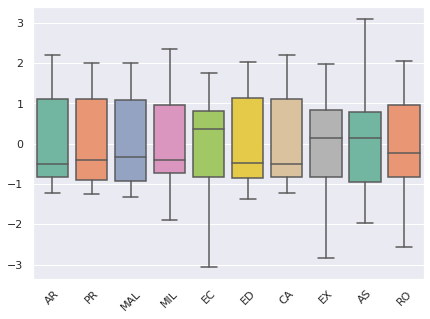

In [17]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

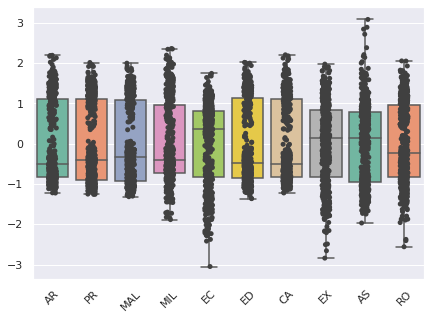

In [18]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

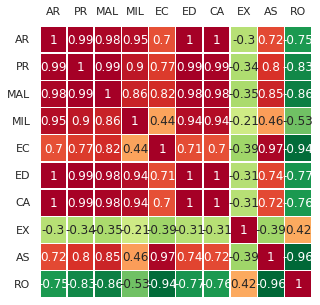

In [19]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

##**Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

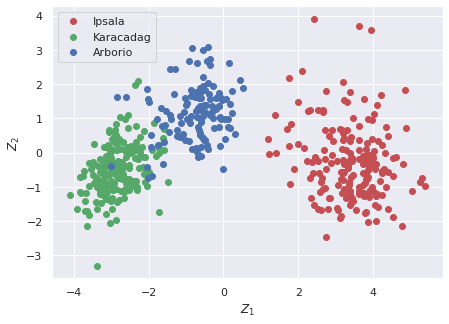

In [20]:
pca = PCA()
Z = pca.fit_transform(X)

# 1(Ipsala)->1,  2(Karacadag)->2, 3(Arborio)->3
idx_Ipsala = np.where(y == 1)
idx_Karacadag = np.where(y == 2)
idx_Arborio = np.where(y == 3)

plt. figure()
plt.scatter(Z[idx_Ipsala,0], Z[idx_Ipsala,1], c='r', label='Ipsala')
plt.scatter(Z[idx_Karacadag,0], Z[idx_Karacadag,1], c='g', label='Karacadag')
plt.scatter(Z[idx_Arborio,0], Z[idx_Arborio,1], c='b', label='Arborio')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')


**Eigenvectors**

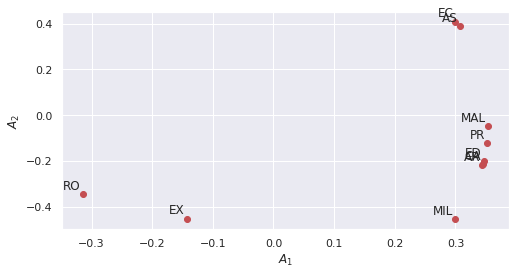

In [21]:
A = pca.components_.T 
plt. figure(figsize=(8,4))


plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')


**
Eigen Vector**

In [22]:
print (list(A))


[array([ 0.34421966, -0.21814446, -0.05204883, -0.09981739,  0.04738113,
       -0.4855909 ,  0.26762952, -0.4151522 , -0.21204144,  0.54246774]), array([ 0.35207464, -0.12193728, -0.00780595,  0.08329547,  0.08433394,
        0.05189988, -0.4531687 ,  0.63991914, -0.29040786,  0.38101808]), array([ 0.35427692, -0.04892821,  0.04126017, -0.07302173,  0.25931665,
        0.01843993, -0.55342126, -0.33932919,  0.61319229, -0.00707039]), array([ 0.29981737, -0.45520112, -0.19307456,  0.0811871 , -0.27642605,
        0.58050616,  0.3816063 ,  0.04862239,  0.28534312,  0.12737896]), array([ 0.29974002,  0.40828012,  0.26964386, -0.50808227, -0.63816402,
        0.0188329 , -0.03729055,  0.03282536,  0.03498904,  0.03615985]), array([ 0.34621627, -0.200418  , -0.04190719, -0.07824977,  0.01718053,
        0.23066431, -0.18906053, -0.33979038, -0.60133176, -0.51554361]), array([ 0.34459515, -0.21486449, -0.05248511, -0.04757008,  0.01335962,
       -0.53623976,  0.23921101,  0.39990313,  0.22

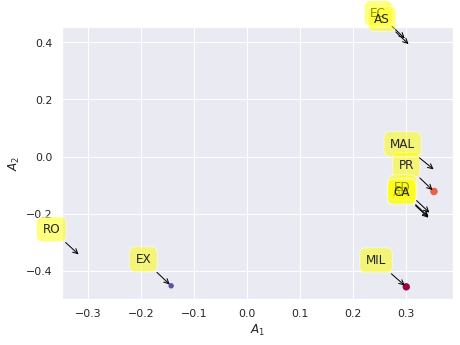

In [26]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->',color='black', connectionstyle='arc3,rad=0'))

**Scree plot**

[7.92730946e+00 1.23967958e+00 7.58066460e-01 5.77412101e-02
 3.21348934e-02 3.86601239e-03 7.93598258e-04 1.13809837e-04
 5.87901925e-05 3.81679017e-05]


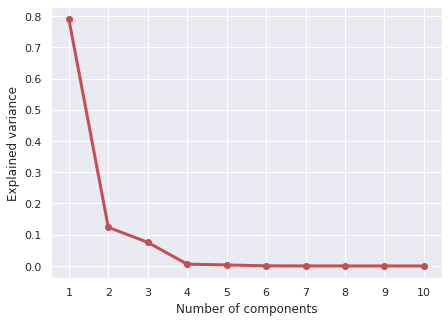

In [27]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
print(Lambda)

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

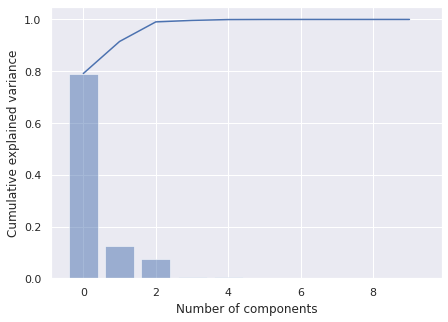

In [28]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([ 1.23239765, -0.24935696, -1.21358167,  3.90893348, -0.74073475,
       -0.40304429,  0.78769352,  0.58150926,  0.49230656, -0.34388566,
        0.0744559 , -0.95041302, -0.15141954, -1.52548317, -1.48306836,
       -1.02213779, -1.64098774, -0.01770676, -0.12652537,  0.64506354,
        1.48455321,  1.02047043, -0.16980126, -0.05724319,  1.1977683 ,
       -0.3946022 ,  1.79645607,  2.39435573, -1.33603325, -1.21370168,
        0.70165315, -1.66619599, -0.33489751,  0.05276586,  1.2360831 ,
       -1.18598393, -1.64209649, -2.00689974, -0.62271387, -1.59095719,
       -0.60739344, -0.55978021, -1.53504208, -0.33080095, -0.76586043,
       -0.48249083,  0.39817335,  0.65403053,  3.57352541, -1.26931612,
        0.66760454, -1.27838031, -0.60845585, -1.12751863, -1.32881682,
        0.1445603 ,  0.10540394, -1.13198947, -0.09620554,  0.36517631,
       -0.17827587, -0.12772981,  0.46670228,  1.75526401, -1.20461653,
       -0.49141677,  0.98651123, -1.7522809 , -1.3318652 , -0.49

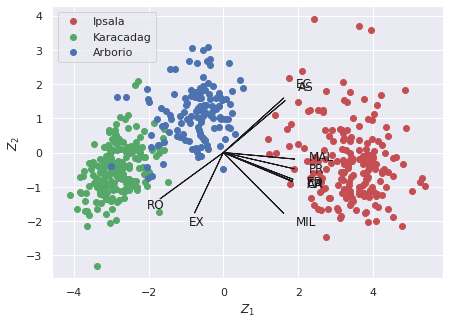

In [29]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Ipsala,0], Z[idx_Ipsala,1], c='r', label='Ipsala')
plt.scatter(Z[idx_Karacadag,0], Z[idx_Karacadag,1], c='g', label='Karacadag')
plt.scatter(Z[idx_Arborio,0], Z[idx_Arborio,1], c='b', label='Arborio')
plt.legend(loc='upper left')
Z1
Z2

##**Using PCA Library**

In [30]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for adjustText: filename=adjustText-0.7.3-py3-none-any.whl size=7096 sha256=c2c7e323fd8a56a86887bc50b9e19dd2b9b40d9ff93f7233e8bcf1b54b93d765
  Stored in directory: /root/.cache/pip/wheels/06/b2/e0/b239bd2c0ff89b98c4f0c86a63e7059f38a8dfaf6df2641c63
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=3ddea75f1b6a2e1b8572c1d02b3c4a76fc6bc3cd3d26e934ba2f355568ca932c
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built adjustText wget


In [31]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [32]:
out['PC']

,PC1,PC2,PC3
0,2.668693,1.232398,-1.182958
1,2.542091,-0.249357,-0.073936
2,3.615738,-1.213582,-0.106952
3,2.431913,3.908933,-0.433532
4,2.626418,-0.740735,1.542344
...,...,...,...
501,-0.594100,0.884222,0.240800
502,-1.396575,0.972696,1.340565
503,-0.629443,0.514353,0.645202
504,0.524242,1.889406,-0.335545


**Scatter plot**

[colourmap]> Warning: Colormap [Set1] can not create [506] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [506] unique colors! Available unique colors: [9].


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fc90c6ea190>)

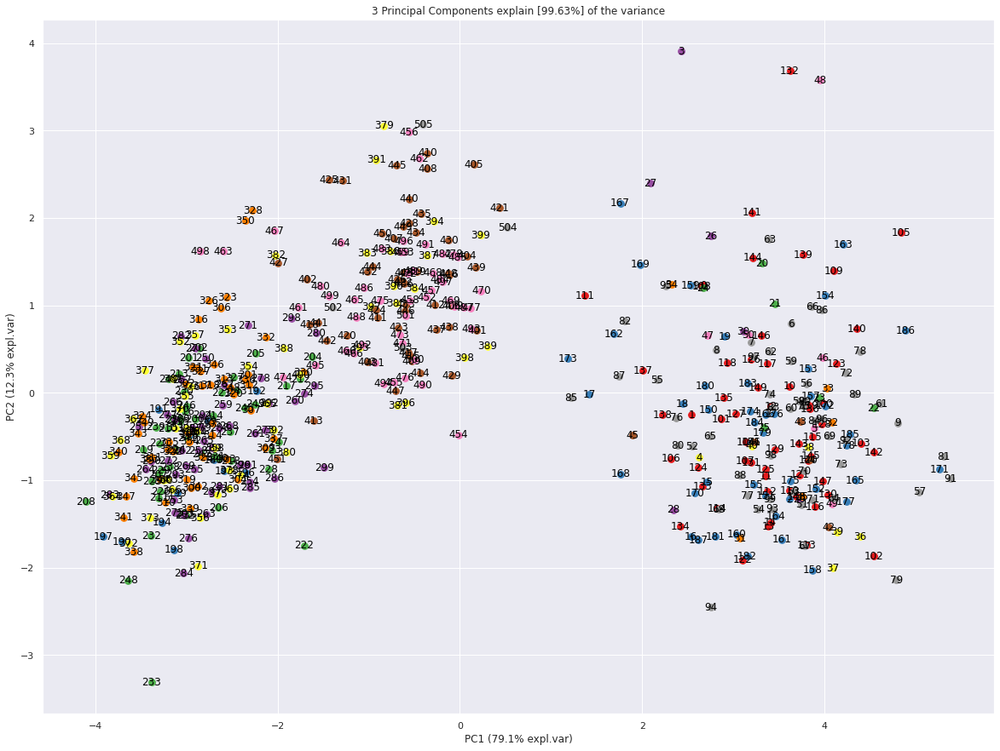

In [33]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [34]:
A = out['loadings'].T

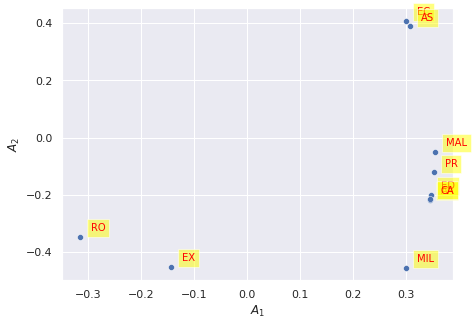

In [35]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

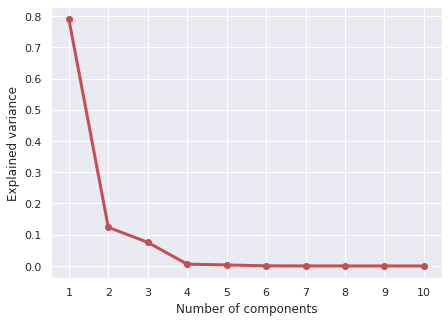

In [36]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

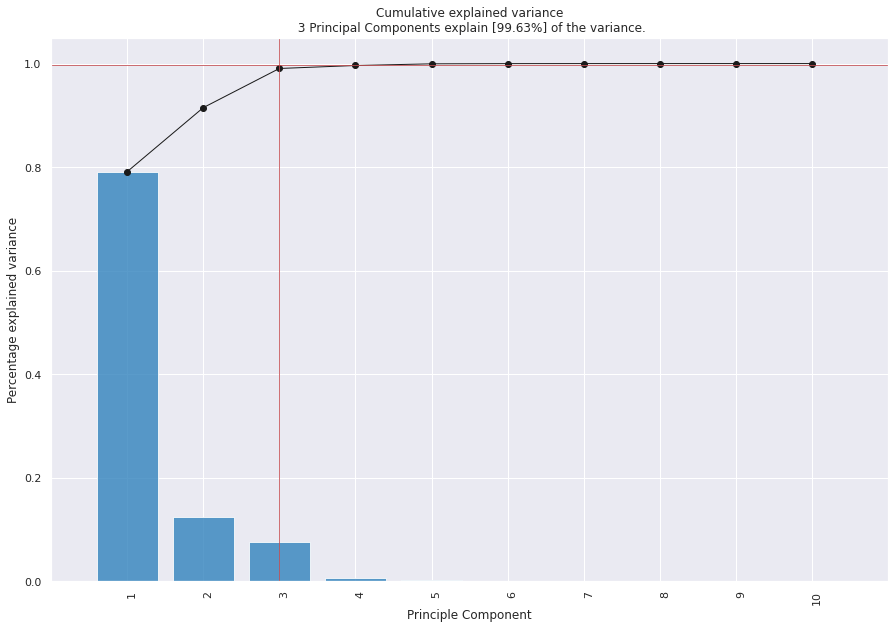

<Figure size 504x360 with 0 Axes>

In [37]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [506] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [506] unique colors! Available unique colors: [9].


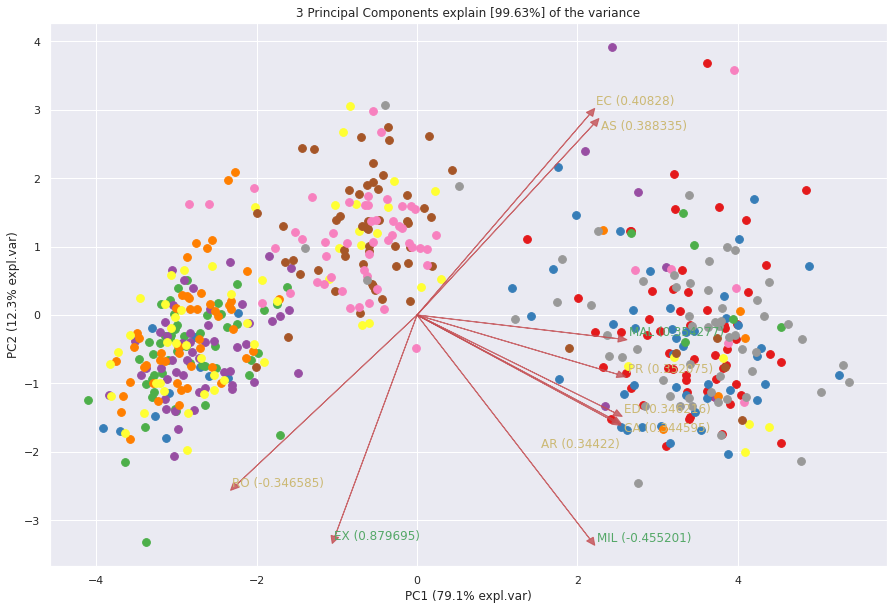

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fc91216ba00>)

In [38]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [506] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [506] unique colors! Available unique colors: [9].


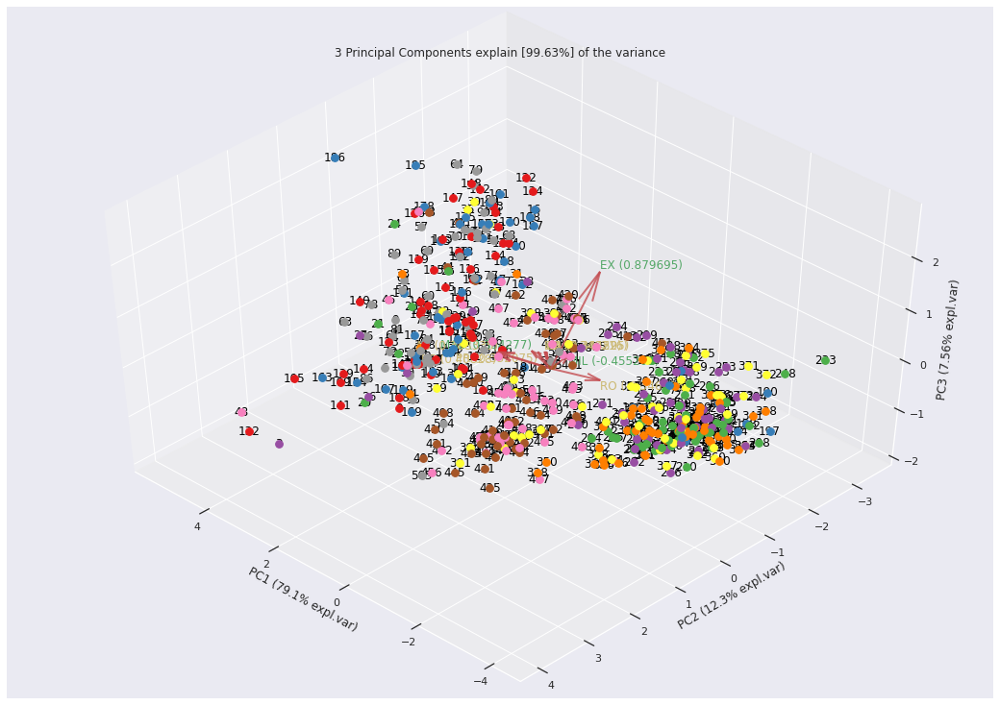

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fc90c6fbc40>)

In [39]:
model.biplot3d(legend=False)

#**Classification using Pycaret**
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which show the highest accuracy on the original dataset can be found. Before applying PCA, the output from compare_models() function shows that Gradient Boosting Classifier, Logistic Regression, and Quadratic Discriminant Analysis show the best performance.

However, after applying PCA, the these models performance decreases and Light Gradient Boosting Machine, Naive Bayes, and K-nearest neighbors classifier show the highest performance. Therefore, in this study Light Gradient Boosting Machine, Naive Bayes, and K-nearest neighbors classifier,are *taken* as my classification algorithms and applied these three models to the original dataset before applying PCA and after applying PCA.

**PyCaret**

PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook.

In [40]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [41]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (455, 11)
Unseen Data For Predictions: (51, 11)


**Setting up the Environment in PyCaret**

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline (we will see them in later tutorials).

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [42]:
from pycaret.classification import *
clf = setup(data=data, target='class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(455, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

* **session_id** : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 123 for later reproducibility.

* **Target Type** : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

* **Label Encoded** : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference. 

* **Original Data** : Displays the original shape of the dataset. In this experiment (189, 8) means 189 samples and 8 features including the class column.

* **Missing Values** : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

* **Numeric Features** : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

* **Categorical Features** : The number of features inferred as categorical. In this dataset, there are no categorical features.

* **Transformed Train Set** : Displays the shape of the transformed training set. Notice that the original shape of (189, 8) is transformed into (132, 7) for the transformed train set.

* **Transformed Test Set** : Displays the shape of the transformed test/hold-out set. There are 57 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline. 

# **Comparing All Models**

In [43]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9684,0.9948,0.9607,0.9725,0.9677,0.9516,0.9538,0.260
lr,Logistic Regression,0.9652,0.9972,0.9591,0.9709,0.9645,0.9466,0.9496,0.293
qda,Quadratic Discriminant Analysis,0.9621,0.9961,0.9563,0.9680,0.9614,0.9419,0.9450,0.012
lda,Linear Discriminant Analysis,0.9620,0.9965,0.9574,0.9650,0.9616,0.9417,0.9435,0.012
et,Extra Trees Classifier,0.9619,0.9963,0.9523,0.9686,0.9603,0.9412,0.9450,0.153
dt,Decision Tree Classifier,0.9591,0.9704,0.9538,0.9665,0.9583,0.9376,0.9414,0.012
lightgbm,Light Gradient Boosting Machine,0.9557,0.9937,0.9478,0.9604,0.9544,0.9320,0.9354,0.145
nb,Naive Bayes,0.9525,0.9943,0.9484,0.9596,0.9523,0.9275,0.9311,0.013
rf,Random Forest Classifier,0.9525,0.9942,0.9426,0.9580,0.9510,0.9269,0.9301,0.226
ada,Ada Boost Classifier,0.9465,0.9885,0.9393,0.9588,0.9443,0.9186,0.9253,0.087


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


**Comparing best model**

In [44]:
best_model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Gradient Boosting Classifier ('gbc')
* Light Gradient Boosting Machine ('lightgbm')
* K-Nearest neighbour classifier ('knn')
* Naive Bayes ('nb')
There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

**Create Light Gradient Boosting Machine**

In [45]:
lightgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9688,0.9987,0.9583,0.9712,0.9683,0.9521,0.9536
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9786,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9375,0.9943,0.9306,0.9375,0.9375,0.9048,0.9048
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.8387,0.9683,0.7839,0.8489,0.8260,0.7467,0.7635


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


In [46]:
#trained model object is stored in the variable 'light'. 
lightgbm

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Gradient Boosting Model**

In [47]:
tuned_lightgbm = tune_model(lightgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9957,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8750,0.9849,0.8750,0.8962,0.8759,0.8118,0.8202
7,0.9375,0.9971,0.9306,0.9375,0.9375,0.9048,0.9048
8,0.9677,1.0000,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.8710,0.9796,0.8095,0.9054,0.8551,0.7954,0.8182


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:LGBMClassifier(bagging_fraction=0.9, bagging_freq=3, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.4, max_depth=-1,
               min_child_samples=6, min_child_weight=0.001, min_split_gain=0.3,
               n_estimators=20, n_jobs=-1, num_leaves=150, objective=None,
               random_state=123, reg_alpha=0.005, reg_lambda=0.0005,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


In [48]:
#tuned model object is stored in the variable 'tuned_lightbm'. 
tuned_lightgbm

LGBMClassifier(bagging_fraction=0.9, bagging_freq=3, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.4, max_depth=-1,
               min_child_samples=6, min_child_weight=0.001, min_split_gain=0.3,
               n_estimators=20, n_jobs=-1, num_leaves=150, objective=None,
               random_state=123, reg_alpha=0.005, reg_lambda=0.0005,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

**Evaluate Light Gradient Boosting Model**

Update statmodels

In [49]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Analyze model performance using various plots**

In [50]:
evaluate_model(tuned_lightgbm)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMClassifier(bagging_fraction=0.9, bagging_freq=3, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.4, max_depth=-1,
               min_child_samples=6, min_child_weight=0.001, min_split_gain=0.3,
               n_estimators=20, n_jobs=-1, num_leaves=150, objective=None,
               random_state=123, reg_alpha=0.005, reg_lambda=0.0005,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K-Nearest neighbour classifier**

In [51]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9375,0.9693,0.9306,0.9375,0.9375,0.9048,0.9048
3,0.8125,0.9365,0.8056,0.8318,0.8188,0.7176,0.7208
4,0.9375,0.9900,0.9306,0.9375,0.9375,0.9048,0.9048
5,0.8750,0.9384,0.8611,0.8750,0.8750,0.8095,0.8095
6,0.8125,0.9487,0.7639,0.8087,0.7906,0.7073,0.7224
7,0.9375,0.9678,0.9167,0.9464,0.9354,0.9036,0.9092
8,0.9677,0.9942,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.8387,0.9276,0.7839,0.8489,0.8260,0.7467,0.7635


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune K-Nearest neighbour classifier**

In [52]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9375,0.9650,0.9306,0.9375,0.9375,0.9048,0.9048
3,0.8750,0.9701,0.8611,0.8750,0.8750,0.8095,0.8095
4,0.9375,0.9742,0.9306,0.9375,0.9375,0.9048,0.9048
5,0.9062,0.9562,0.8889,0.9066,0.9050,0.8563,0.8576
6,0.8438,0.9507,0.8056,0.8500,0.8344,0.7576,0.7684
7,0.9062,0.9714,0.8889,0.9066,0.9050,0.8563,0.8576
8,0.9677,1.0000,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.8387,0.9634,0.7619,0.8891,0.8088,0.7425,0.7771


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


**Evaluate K-Nearest neighbour classifierModel**

In [53]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Quadratic Discriminant Analysis Model**

In [54]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9885,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9375,0.9943,0.9306,0.9375,0.9375,0.9048,0.9048
8,0.9677,0.9970,0.9697,0.9718,0.9680,0.9505,0.9520
9,0.9032,0.9839,0.8571,0.9240,0.8958,0.8475,0.8608


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)
INFO:logs:create_model() succesfully completed......................................


**Tune Quadratic Discriminant Analysis Model**

In [55]:
tuned_qda = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9375,0.9914,0.9444,0.9500,0.9381,0.9059,0.9113
6,0.9062,0.9943,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,0.9914,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9677,0.9941,0.9697,0.9718,0.9680,0.9505,0.9520
9,0.9355,0.9941,0.9048,0.9454,0.9328,0.8990,0.9051


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.66,
                              store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Quadratic Discriminant Analysis Model**

In [56]:
evaluate_model(tuned_qda)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=QuadraticDiscriminantAnalysis(priors=None, reg_param=0.66,
                              store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Naive Bayes**

In [57]:
nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
3,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9375,0.9841,0.9444,0.9500,0.9381,0.9059,0.9113
6,0.9062,0.9859,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,0.9943,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9355,0.9914,0.9441,0.9498,0.9381,0.9019,0.9063
9,0.8710,0.9874,0.8315,0.8788,0.8654,0.7987,0.8081


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:GaussianNB(priors=None, var_smoothing=1e-09)
INFO:logs:create_model() succesfully completed......................................


**Tune Naive Bayes**

In [58]:
tuned_nb = tune_model(nb)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
3,0.9688,0.9948,0.9722,0.9722,0.9690,0.9527,0.9541
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9375,0.9768,0.9444,0.9500,0.9381,0.9059,0.9113
6,0.9375,0.9872,0.9444,0.9500,0.9381,0.9059,0.9113
7,0.9688,0.9943,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9355,0.9944,0.9441,0.9498,0.9381,0.9019,0.9063
9,0.8387,0.9860,0.7839,0.8489,0.8260,0.7467,0.7635


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:GaussianNB(priors=None, var_smoothing=2e-09)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Naive bayes**

In [59]:
evaluate_model(tuned_nb)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GaussianNB(priors=None, var_smoothing=2e-09), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Tune the Best Model**

In [60]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9957,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
6,0.9062,0.9786,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9355,1.0000,0.9048,0.9454,0.9328,0.8990,0.9051
9,0.8710,0.9766,0.8095,0.9054,0.8551,0.7954,0.8182


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.15, loss='deviance', max_depth=7,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_impurity_split=None,
                           min_samples_leaf=5, min_samples_split=5,
                           min_weight_fraction_leaf=0.0, n_estimators=230,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.85, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [61]:
tuned_best_model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.15, loss='deviance', max_depth=7,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_impurity_split=None,
                           min_samples_leaf=5, min_samples_split=5,
                           min_weight_fraction_leaf=0.0, n_estimators=230,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.85, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [62]:
evaluate_model(tuned_best_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.15, loss='deviance', max_depth=7,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_impurity_split=None,
                           min_samples_leaf=5, min_samples_split=5,
                           min_weight_fraction_leaf=0.0, n_estimators=230,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.85, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Classification + PCA**

In [63]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(455, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='class')),
                ('fix_perfect', Remove_100(target='class')),
                ('clean_names', Clean_Colum_Names()),
       

# **Comparing models**

In [64]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9715,0.9956,0.9643,0.9755,0.9707,0.9560,0.9583,0.058
knn,K Neighbors Classifier,0.9653,0.9950,0.9611,0.9703,0.9651,0.9471,0.9496,0.020
nb,Naive Bayes,0.9653,0.9966,0.9611,0.9701,0.9651,0.9471,0.9494,0.012
svm,SVM - Linear Kernel,0.9653,0.0000,0.9583,0.9698,0.9650,0.9470,0.9492,0.015
qda,Quadratic Discriminant Analysis,0.9653,0.9983,0.9611,0.9701,0.9651,0.9471,0.9494,0.011
gbc,Gradient Boosting Classifier,0.9652,0.9958,0.9573,0.9699,0.9644,0.9465,0.9491,0.218
rf,Random Forest Classifier,0.9651,0.9953,0.9554,0.9721,0.9634,0.9461,0.9501,0.190
lr,Logistic Regression,0.9621,0.9962,0.9563,0.9665,0.9618,0.9421,0.9442,0.017
lda,Linear Discriminant Analysis,0.9621,0.9969,0.9585,0.9679,0.9621,0.9422,0.9448,0.012
et,Extra Trees Classifier,0.9621,0.9969,0.9546,0.9675,0.9616,0.9419,0.9447,0.156


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:compare_models() succesfully completed......................................


# **Best Model with PCA**

In [65]:
best_model_pca

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

# **Tune the Best Model**

In [66]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,0.9987,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9867,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9857,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9375,0.9971,0.9306,0.9375,0.9375,0.9048,0.9048
8,0.9677,0.9887,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.8710,0.9914,0.8095,0.9054,0.8551,0.7954,0.8182


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


In [67]:
tuned_best_model_pca

LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

# **Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [68]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Note:** The AUC metric is not available for Multiclass classification however the column will still be shown with zero values to maintain consistency between the Binary Classification and Multiclass Classification display grids.

In [69]:
lightgbm_pca = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9375,0.9987,0.9306,0.9399,0.9374,0.9048,0.9061
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9375,0.9828,0.9444,0.9500,0.9381,0.9059,0.9113
7,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9677,1.0000,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.9032,0.9774,0.8571,0.9240,0.8958,0.8475,0.8608


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


# **Tune LightGBM Model**

In [70]:
tuned_lightgbm_pca = tune_model(lightgbm_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,0.9987,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9867,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9857,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9375,0.9971,0.9306,0.9375,0.9375,0.9048,0.9048
8,0.9677,0.9887,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.8710,0.9914,0.8095,0.9054,0.8551,0.7954,0.8182


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


#**Evaluate LightGBM Model**

In [71]:
tuned_lightgbm_pca

LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

In [72]:
evaluate_model(tuned_lightgbm_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create K-nearest neighbour Model**

In [73]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9375,0.9987,0.9306,0.9399,0.9374,0.9048,0.9061
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9957,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,0.9986,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9749,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,0.9943,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9677,0.9970,0.9697,0.9718,0.9680,0.9505,0.9520
9,0.9355,0.9911,0.9048,0.9454,0.9328,0.8990,0.9051


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


# **Tune K-Nearest neighbour Model**

In [74]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,0.9987,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9062,0.9971,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,0.9943,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9355,0.9941,0.9221,0.9355,0.9355,0.9003,0.9003
9,0.9355,0.9941,0.9048,0.9454,0.9328,0.8990,0.9051


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


In [75]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance')

# **Evaluate K-Nearest neighbour Model**

In [76]:
evaluate_model(tuned_knn_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create Naive Bayes Model**


In [77]:
nb_pca = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9846,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9375,0.9943,0.9306,0.9375,0.9375,0.9048,0.9048
8,0.9677,0.9941,0.9697,0.9718,0.9680,0.9505,0.9520
9,0.9355,0.9957,0.9048,0.9454,0.9328,0.8990,0.9051


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:GaussianNB(priors=None, var_smoothing=1e-09)
INFO:logs:create_model() succesfully completed......................................


# **Tune Naive Bayes Model**

In [78]:
tuned_nb_pca = tune_model(nb_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9971,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9846,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9375,0.9943,0.9306,0.9375,0.9375,0.9048,0.9048
8,0.9677,0.9941,0.9697,0.9718,0.9680,0.9505,0.9520
9,0.9355,0.9957,0.9048,0.9454,0.9328,0.8990,0.9051


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:GaussianNB(priors=None, var_smoothing=2e-09)
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Naive Bayes Model**

In [79]:
tuned_nb_pca

GaussianNB(priors=None, var_smoothing=2e-09)

In [80]:
evaluate_model(tuned_nb_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GaussianNB(priors=None, var_smoothing=2e-09), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

In [81]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [82]:
print("Numpy version: ", np.__version__)

Numpy version:  1.21.6


In [85]:
!pip install numba==0.53

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [86]:
import shap

In [87]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,1.0000,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9967,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9062,0.9747,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,0.9882,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9677,0.9987,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.8710,0.9949,0.8095,0.9054,0.8551,0.7954,0.8182


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [88]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9688,0.9987,0.9583,0.9712,0.9683,0.9521,0.9536
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9688,0.9922,0.9583,0.9712,0.9683,0.9521,0.9536
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9688,1.0000,0.9722,0.9722,0.9690,0.9527,0.9541
6,0.9062,0.9637,0.9167,0.9318,0.9070,0.8596,0.8711
7,0.9688,0.9943,0.9583,0.9712,0.9683,0.9521,0.9536
8,0.9677,0.9957,0.9524,0.9704,0.9672,0.9498,0.9514
9,0.9355,1.0000,0.9048,0.9454,0.9328,0.8990,0.9051


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=190, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=190, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


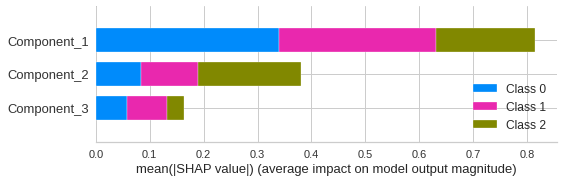

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [89]:
interpret_model(tuned_rf_pca, plot='summary')

In [ ]:
#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

**Visualize a single prediction**

In [90]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=190, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


From the above the plot, we can seethe "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [91]:
interpret_model(tuned_rf_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=190, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
